In [34]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import pandas as pd
import numpy as np
import re
data=pd.read_csv('Desktop/Data/EXL intern/data2.csv')
df=data.copy()

# EDA

In [35]:
print(df.shape)
#df.head()

(9999, 6)


In [36]:
df['Content'] = df['Content'].astype(str).str.lower()
df.head(3)

,id,Title,Content,Time2,Source,Tags
0,0,Fast service,"fast service, very good",29/05/2022,TrustPilot,NaN
1,1,Seamless and professionally conducted,nan,29/05/2022,TrustPilot,NaN
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,29/05/2022,TrustPilot,NaN


In [37]:
df.groupby('Source')['id'].count()

Source
LC            6579
TrustPilot    3420
Name: id, dtype: int64

In [38]:
df.groupby('Tags')['id'].count()

Tags
  Acquire business location            4
  Debt consolidation / refinance    5232
  Emergency repairs                  164
  Equipment purchase                  69
  Inventory purchase                  26
  Marketing                            5
  Other business purpose             547
  Remodel                            306
  Working capital                     72
Name: id, dtype: int64

In [39]:
df.isna().sum()

id            0
Title         0
Content       0
Time2         0
Source        0
Tags       3574
dtype: int64

In [40]:
df['Time2'] = pd.to_datetime(df['Time2'])
df

,id,Title,Content,Time2,Source,Tags
0,0,Fast service,"fast service, very good",2022-05-29,TrustPilot,NaN
1,1,Seamless and professionally conducted,nan,2022-05-29,TrustPilot,NaN
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,2022-05-29,TrustPilot,NaN
3,3,Quick and efficient in obtaining loan…,quick and efficient in obtaining loan in a spe...,2022-05-29,TrustPilot,NaN
4,4,Very easy to work with to secure a…,very easy to work with to secure a loan. fast...,2022-05-29,TrustPilot,NaN
...,...,...,...,...,...,...
9994,9994,Effortless,the application process was simple and i had t...,2021-06-15,LC,Debt consolidation / refinance
9995,9995,Easy to apply and quick response,lendingclub has come threw a couple of times f...,2021-06-15,LC,Equipment purchase
9996,9996,Easiest Loan application ever!,it was so easy to apply for my loan without hu...,2021-06-15,LC,Debt consolidation / refinance
9997,9997,"Easy, Easy, Easy!!!!!",i received a letter in the mail with a pre-app...,2021-06-15,LC,Debt consolidation / refinance


# Data Processing

## NLP

### Cleaning and removing numerical characters

In [41]:
def cleaning_numbers(data):
    return re.sub('[0-9]+', '', data)
df['Content'] = df['Content'].apply(lambda x: cleaning_numbers(x))
df['Content'].head()

0                              fast service, very good
1                                                  nan
2    totally happy with lendingclub!!!! i was unsur...
3    quick and efficient in obtaining loan in a spe...
4    very easy to work with to secure a loan.  fast...
Name: Content, dtype: object

### Spelling correction

In [42]:
def correct_spelling(text):
    corrected_text = []
    word_list = text.split()
    for word in word_list:
        corrected_word = TextBlob(word)
        corrected_text.append(str(corrected_word.correct()))
    correct_text = ' '.join(corrected_text)
    return correct_text

df['Content'] = df['Content'].apply(lambda x: cleaning_numbers(x))
df['Content'].head()

0                              fast service, very good
1                                                  nan
2    totally happy with lendingclub!!!! i was unsur...
3    quick and efficient in obtaining loan in a spe...
4    very easy to work with to secure a loan.  fast...
Name: Content, dtype: object

### Tokenization

In [43]:
from nltk.tokenize import RegexpTokenizer

In [44]:
regexp = RegexpTokenizer('\w+')

df['1_token']=df['Content'].apply(regexp.tokenize)
df.head(3)

,id,Title,Content,Time2,Source,Tags,1_token
0,0,Fast service,"fast service, very good",2022-05-29,TrustPilot,NaN,"[fast, service, very, good]"
1,1,Seamless and professionally conducted,nan,2022-05-29,TrustPilot,NaN,[nan]
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,2022-05-29,TrustPilot,NaN,"[totally, happy, with, lendingclub, i, was, un..."


### Remove Stopwords

In [45]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/adityaagrawal/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [46]:
from nltk.corpus import stopwords

In [47]:
# Make a list of english stopwords
stopwords = nltk.corpus.stopwords.words("english")

In [48]:
# Extend the list with your own custom stopwords
my_stopwords = ['a', 'about', 'above', 'after', 'again', 'ain', 'all', 'am', 'an', 'and','any','are', 'as', 'at', 'be', 'because', 'been', 'before',
                'being', 'below', 'between','both', 'by', 'can', 'd', 'did', 'do', 'does', 'doing', 'down', 'during', 'each','few', 'for', 'from',
                'further', 'had', 'has', 'have', 'having', 'he', 'her', 'here', 'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in',
                'into','is', 'it', 'its', 'itself', 'just', 'll', 'm', 'ma', 'me', 'more', 'most','my', 'myself', 'now', 'o', 'of', 'on', 'once',
                'only', 'or', 'other', 'our', 'ours','ourselves', 'out', 'own', 're','s', 'same', 'she', "shes", 'should', "shouldve",'so', 'some',
                'such', 't', 'than', 'that', "thatll", 'the', 'their', 'theirs', 'them', 'themselves', 'then', 'there', 'these', 'they', 'this', 'those',
                'through', 'to', 'too','under', 'until', 'up', 've', 'very', 'was', 'we', 'were', 'what', 'when', 'where','which','while', 'who', 'whom',
                'why', 'will', 'with', 'won', 'y', 'you', "youd","youll", "youre", "youve", 'your', 'yours', 'yourself', 'yourselves', 'lending', 'club', 'lc', 'loan', 'also',
                'trustpilot', 'lendingclub', 'loans', 'money', 'would']
stopwords.extend(my_stopwords)

In [49]:
df['1_token'] = df['1_token'].apply(lambda x: [item for item in x if item not in stopwords])

In [50]:
df

,id,Title,Content,Time2,Source,Tags,1_token
0,0,Fast service,"fast service, very good",2022-05-29,TrustPilot,NaN,"[fast, service, good]"
1,1,Seamless and professionally conducted,nan,2022-05-29,TrustPilot,NaN,[nan]
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,2022-05-29,TrustPilot,NaN,"[totally, happy, unsure, applying, help, conso..."
3,3,Quick and efficient in obtaining loan…,quick and efficient in obtaining loan in a spe...,2022-05-29,TrustPilot,NaN,"[quick, efficient, obtaining, speedy, manner]"
4,4,Very easy to work with to secure a…,very easy to work with to secure a loan. fast...,2022-05-29,TrustPilot,NaN,"[easy, work, secure, fast]"
...,...,...,...,...,...,...,...
9994,9994,Effortless,the application process was simple and i had t...,2021-06-15,LC,Debt consolidation / refinance,"[application, process, simple, account, less, ..."
9995,9995,Easy to apply and quick response,lendingclub has come threw a couple of times f...,2021-06-15,LC,Equipment purchase,"[come, threw, couple, times, like, flexible, p..."
9996,9996,Easiest Loan application ever!,it was so easy to apply for my loan without hu...,2021-06-15,LC,Debt consolidation / refinance,"[easy, apply, without, hurting, credit, score,..."
9997,9997,"Easy, Easy, Easy!!!!!",i received a letter in the mail with a pre-app...,2021-06-15,LC,Debt consolidation / refinance,"[received, letter, mail, pre, approval, code, ..."


### Tokenizing all unique words

In [51]:
df['1_string'] = df['1_token'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
df

,id,Title,Content,Time2,Source,Tags,1_token,1_string
0,0,Fast service,"fast service, very good",2022-05-29,TrustPilot,NaN,"[fast, service, good]",fast service good
1,1,Seamless and professionally conducted,nan,2022-05-29,TrustPilot,NaN,[nan],nan
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,2022-05-29,TrustPilot,NaN,"[totally, happy, unsure, applying, help, conso...",totally happy unsure applying help consolidate...
3,3,Quick and efficient in obtaining loan…,quick and efficient in obtaining loan in a spe...,2022-05-29,TrustPilot,NaN,"[quick, efficient, obtaining, speedy, manner]",quick efficient obtaining speedy manner
4,4,Very easy to work with to secure a…,very easy to work with to secure a loan. fast...,2022-05-29,TrustPilot,NaN,"[easy, work, secure, fast]",easy work secure fast
...,...,...,...,...,...,...,...,...
9994,9994,Effortless,the application process was simple and i had t...,2021-06-15,LC,Debt consolidation / refinance,"[application, process, simple, account, less, ...",application process simple account less hours
9995,9995,Easy to apply and quick response,lendingclub has come threw a couple of times f...,2021-06-15,LC,Equipment purchase,"[come, threw, couple, times, like, flexible, p...",come threw couple times like flexible payments...
9996,9996,Easiest Loan application ever!,it was so easy to apply for my loan without hu...,2021-06-15,LC,Debt consolidation / refinance,"[easy, apply, without, hurting, credit, score,...",easy apply without hurting credit score decide...
9997,9997,"Easy, Easy, Easy!!!!!",i received a letter in the mail with a pre-app...,2021-06-15,LC,Debt consolidation / refinance,"[received, letter, mail, pre, approval, code, ...",received letter mail pre approval code day pen...


In [52]:
all_words = ' '.join([word for word in df['1_string']])

In [53]:
all_words

'fast service good nan totally happy unsure applying help consolidate credit card debt extremely happy thanks making life better quick efficient obtaining speedy manner easy work secure fast pleased simple quick process associates contacted pleasant polite explained everything terms spelled online clear easy understand language impressed customer service speed processing everything remote made things convenient busy lifestyle recommend friends family everything smooth quick paid existing credit cards immediately felt load taken back amazing nan application process fairly quick paid using future recommending anyone else use rates high payment process options customer friendly focused system geared forcing customers set autopay choose autopay website accept past due payment meaning cannot make online payment time using checking account company intentionally set payment options minimal customer control payment options forces customer pay past due set autopay process quick easy thank profe

In [54]:
#nltk.download('punkt')
tokenized_words = nltk.tokenize.word_tokenize(all_words)

In [55]:
tokenized_words

['fast',
 'service',
 'good',
 'nan',
 'totally',
 'happy',
 'unsure',
 'applying',
 'help',
 'consolidate',
 'credit',
 'card',
 'debt',
 'extremely',
 'happy',
 'thanks',
 'making',
 'life',
 'better',
 'quick',
 'efficient',
 'obtaining',
 'speedy',
 'manner',
 'easy',
 'work',
 'secure',
 'fast',
 'pleased',
 'simple',
 'quick',
 'process',
 'associates',
 'contacted',
 'pleasant',
 'polite',
 'explained',
 'everything',
 'terms',
 'spelled',
 'online',
 'clear',
 'easy',
 'understand',
 'language',
 'impressed',
 'customer',
 'service',
 'speed',
 'processing',
 'everything',
 'remote',
 'made',
 'things',
 'convenient',
 'busy',
 'lifestyle',
 'recommend',
 'friends',
 'family',
 'everything',
 'smooth',
 'quick',
 'paid',
 'existing',
 'credit',
 'cards',
 'immediately',
 'felt',
 'load',
 'taken',
 'back',
 'amazing',
 'nan',
 'application',
 'process',
 'fairly',
 'quick',
 'paid',
 'using',
 'future',
 'recommending',
 'anyone',
 'else',
 'use',
 'rates',
 'high',
 'payment',

In [56]:
from nltk import FreqDist
fdist = FreqDist(tokenized_words)
fdist

FreqDist({'easy': 4704, 'process': 3573, 'credit': 2020, 'fast': 1854, 'quick': 1685, 'great': 1634, 'thank': 1559, 'recommend': 1494, 'application': 1451, 'days': 1352, ...})

In [57]:
#nltk.download('wordnet')
#nltk.download('omw-1.4')

In [58]:
df['1_string_fdist'] = df['1_token'].apply(lambda x: ' '.join([item for item in x if fdist[item] >= 1 ]))
df

,id,Title,Content,Time2,Source,Tags,1_token,1_string,1_string_fdist
0,0,Fast service,"fast service, very good",2022-05-29,TrustPilot,NaN,"[fast, service, good]",fast service good,fast service good
1,1,Seamless and professionally conducted,nan,2022-05-29,TrustPilot,NaN,[nan],nan,nan
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,2022-05-29,TrustPilot,NaN,"[totally, happy, unsure, applying, help, conso...",totally happy unsure applying help consolidate...,totally happy unsure applying help consolidate...
3,3,Quick and efficient in obtaining loan…,quick and efficient in obtaining loan in a spe...,2022-05-29,TrustPilot,NaN,"[quick, efficient, obtaining, speedy, manner]",quick efficient obtaining speedy manner,quick efficient obtaining speedy manner
4,4,Very easy to work with to secure a…,very easy to work with to secure a loan. fast...,2022-05-29,TrustPilot,NaN,"[easy, work, secure, fast]",easy work secure fast,easy work secure fast
...,...,...,...,...,...,...,...,...,...
9994,9994,Effortless,the application process was simple and i had t...,2021-06-15,LC,Debt consolidation / refinance,"[application, process, simple, account, less, ...",application process simple account less hours,application process simple account less hours
9995,9995,Easy to apply and quick response,lendingclub has come threw a couple of times f...,2021-06-15,LC,Equipment purchase,"[come, threw, couple, times, like, flexible, p...",come threw couple times like flexible payments...,come threw couple times like flexible payments...
9996,9996,Easiest Loan application ever!,it was so easy to apply for my loan without hu...,2021-06-15,LC,Debt consolidation / refinance,"[easy, apply, without, hurting, credit, score,...",easy apply without hurting credit score decide...,easy apply without hurting credit score decide...
9997,9997,"Easy, Easy, Easy!!!!!",i received a letter in the mail with a pre-app...,2021-06-15,LC,Debt consolidation / refinance,"[received, letter, mail, pre, approval, code, ...",received letter mail pre approval code day pen...,received letter mail pre approval code day pen...


### Lemmatizing

In [59]:
from nltk.stem import WordNetLemmatizer

wordnet_lem = WordNetLemmatizer()

df['1_string_lem'] = df['1_string_fdist'].apply(wordnet_lem.lemmatize)

In [60]:
# check if the columns are equal
df['is_equal']= (df['1_string_fdist']==df['1_string_lem'])

In [61]:
df

,id,Title,Content,Time2,Source,Tags,1_token,1_string,1_string_fdist,1_string_lem,is_equal
0,0,Fast service,"fast service, very good",2022-05-29,TrustPilot,NaN,"[fast, service, good]",fast service good,fast service good,fast service good,True
1,1,Seamless and professionally conducted,nan,2022-05-29,TrustPilot,NaN,[nan],nan,nan,nan,True
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,2022-05-29,TrustPilot,NaN,"[totally, happy, unsure, applying, help, conso...",totally happy unsure applying help consolidate...,totally happy unsure applying help consolidate...,totally happy unsure applying help consolidate...,True
3,3,Quick and efficient in obtaining loan…,quick and efficient in obtaining loan in a spe...,2022-05-29,TrustPilot,NaN,"[quick, efficient, obtaining, speedy, manner]",quick efficient obtaining speedy manner,quick efficient obtaining speedy manner,quick efficient obtaining speedy manner,True
4,4,Very easy to work with to secure a…,very easy to work with to secure a loan. fast...,2022-05-29,TrustPilot,NaN,"[easy, work, secure, fast]",easy work secure fast,easy work secure fast,easy work secure fast,True
...,...,...,...,...,...,...,...,...,...,...,...
9994,9994,Effortless,the application process was simple and i had t...,2021-06-15,LC,Debt consolidation / refinance,"[application, process, simple, account, less, ...",application process simple account less hours,application process simple account less hours,application process simple account less hours,True
9995,9995,Easy to apply and quick response,lendingclub has come threw a couple of times f...,2021-06-15,LC,Equipment purchase,"[come, threw, couple, times, like, flexible, p...",come threw couple times like flexible payments...,come threw couple times like flexible payments...,come threw couple times like flexible payments...,True
9996,9996,Easiest Loan application ever!,it was so easy to apply for my loan without hu...,2021-06-15,LC,Debt consolidation / refinance,"[easy, apply, without, hurting, credit, score,...",easy apply without hurting credit score decide...,easy apply without hurting credit score decide...,easy apply without hurting credit score decide...,True
9997,9997,"Easy, Easy, Easy!!!!!",i received a letter in the mail with a pre-app...,2021-06-15,LC,Debt consolidation / refinance,"[received, letter, mail, pre, approval, code, ...",received letter mail pre approval code day pen...,received letter mail pre approval code day pen...,received letter mail pre approval code day pen...,True


In [62]:
df.is_equal.value_counts()

True    9999
Name: is_equal, dtype: int64

In [63]:
conda install -c conda-forge wordcloud

Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [64]:
all_words_lem = ' '.join([word for word in df['1_string_lem']])

### Wordcloud function

In [65]:
%matplotlib inline
from wordcloud import WordCloud
import matplotlib.pyplot as plt
def wordcloud(df):
    wordcloud = WordCloud(width=600, 
                         height=400, 
                         random_state=2, 
                         #max_font_size=100).generate(' '.join([word for word in df_process[df_process['sentiment']=='negative']['1_string_lem']]))
                         max_font_size=100).generate(" ".join(df))
    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off');

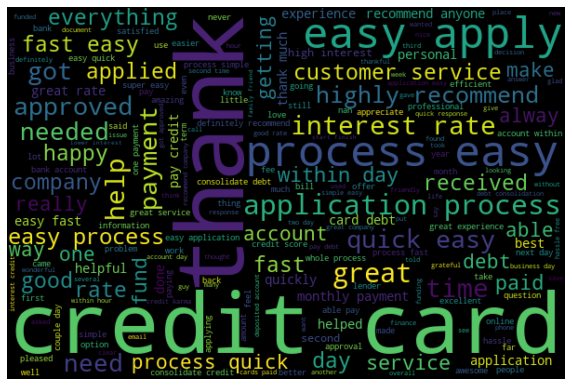

In [66]:
wordcloud(df['1_string_lem'])

In [67]:
'''
from wordcloud import WordCloud
def wordcloud(df, feature):
    wordcloud = WordCloud(width = 800,
                         height = 600,
                         colormap = 'Set3',
                         margin = 0,
                         max_words = 200,
                         min_word_length = 4,
                         max_font_size = 130, min_font_size = 15,
                         background_color ='black').generate(" ".join(df[feature]))
    plt.figure(figsize = (20,15))
    plt.imshow(wordcloud)
    plt.axis('off')
'''

'\nfrom wordcloud import WordCloud\ndef wordcloud(df, feature):\n    wordcloud = WordCloud(width = 800,\n                         height = 600,\n                         colormap = \'Set3\',\n                         margin = 0,\n                         max_words = 200,\n                         min_word_length = 4,\n                         max_font_size = 130, min_font_size = 15,\n                         background_color =\'black\').generate(" ".join(df[feature]))\n    plt.figure(figsize = (20,15))\n    plt.imshow(wordcloud)\n    plt.axis(\'off\')\n'

In [68]:
#wordcloud(df,'1_string_lem')

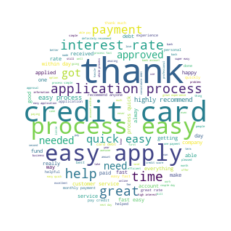

In [69]:
import numpy as np

x, y = np.ogrid[:300, :300]
mask = (x - 150) ** 2 + (y - 150) ** 2 > 130 ** 2
mask = 255 * mask.astype(int)

wc = WordCloud(background_color="white", repeat=True, mask=mask)
wc.generate(all_words_lem)

plt.axis("off")
plt.imshow(wc, interpolation="bilinear");

In [70]:
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

words = nltk.word_tokenize(all_words_lem)
fd = FreqDist(words)

In [71]:
fd.most_common()

[('easy', 4704),
 ('process', 3573),
 ('credit', 2020),
 ('fast', 1854),
 ('quick', 1685),
 ('great', 1634),
 ('thank', 1559),
 ('recommend', 1494),
 ('application', 1451),
 ('days', 1352),
 ('pay', 1187),
 ('account', 1135),
 ('get', 1126),
 ('rate', 1113),
 ('time', 1111),
 ('service', 1101),
 ('interest', 1044),
 ('debt', 1015),
 ('approved', 1003),
 ('apply', 992),
 ('help', 946),
 ('cards', 893),
 ('payment', 882),
 ('within', 821),
 ('one', 790),
 ('simple', 768),
 ('funds', 750),
 ('got', 744),
 ('needed', 744),
 ('company', 728),
 ('good', 718),
 ('rates', 697),
 ('experience', 687),
 ('much', 661),
 ('paid', 639),
 ('received', 626),
 ('able', 615),
 ('card', 597),
 ('approval', 593),
 ('highly', 592),
 ('customer', 590),
 ('thanks', 570),
 ('need', 561),
 ('bank', 551),
 ('everything', 543),
 ('applied', 535),
 ('payments', 522),
 ('really', 503),
 ('consolidate', 498),
 ('quickly', 480),
 ('day', 469),
 ('helped', 452),
 ('took', 451),
 ('happy', 436),
 ('high', 434),
 ('mad

In [72]:
fd.tabulate(10)

       easy     process      credit        fast       quick       great       thank   recommend application        days 
       4704        3573        2020        1854        1685        1634        1559        1494        1451        1352 


In [73]:
# Obtain top 10 words
top_10 = fd.most_common(10)

# Create pandas series to make plotting easier
fdist = pd.Series(dict(top_10))

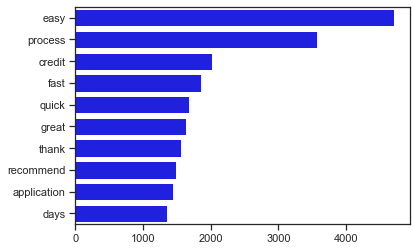

In [74]:
import seaborn as sns
sns.set_theme(style="ticks")
sns.barplot(y=fdist.index, x=fdist.values, color='blue');

In [75]:
#pip install plotly

In [76]:
import plotly.express as px

fig = px.bar(y=fdist.index, x=fdist.values)

# sort values
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total ascending'})

# show plot
fig.show()

In [77]:
#nltk.download('vader_lexicon')

In [78]:
from nltk.sentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()

In [79]:
df_process = df[(df['1_string_lem'].str.contains('process')) | (df['1_string_lem'].str.contains('application'))]
df_service= df[df['1_string_lem'].str.contains('service')]
df_rates= df[df['1_string_lem'].str.contains('rates') | df['1_string_lem'].str.contains('interest') | df['1_string_lem'].str.contains('rate') | df['1_string_lem'].str.contains('apr') ]
df_exp= df[(df['1_string_lem'].str.contains('experience')) | (df['1_string_lem'].str.contains('exp'))]

In [80]:
df_process['1_string_lem']

5       pleased simple quick process associates contac...
6       impressed customer service speed processing ev...
10      application process fairly quick paid using fu...
11      process quick easy thank professionalism knowl...
12      process easy happy received dollars instead do...
                              ...                        
9989    process easy fast took gamble came right time ...
9991    application process easy quick approval fundin...
9992         process point quick turn around time service
9994        application process simple account less hours
9998    easy application process good rates definitely...
Name: 1_string_lem, Length: 3928, dtype: object

In [81]:
df['polarity'] = df['1_string_lem'].apply(lambda x: analyzer.polarity_scores(x))
df.tail(3)

,id,Title,Content,Time2,Source,Tags,1_token,1_string,1_string_fdist,1_string_lem,is_equal,polarity
9996,9996,Easiest Loan application ever!,it was so easy to apply for my loan without hu...,2021-06-15,LC,Debt consolidation / refinance,"[easy, apply, without, hurting, credit, score,...",easy apply without hurting credit score decide...,easy apply without hurting credit score decide...,easy apply without hurting credit score decide...,True,"{'neg': 0.103, 'neu': 0.52, 'pos': 0.376, 'com..."
9997,9997,"Easy, Easy, Easy!!!!!",i received a letter in the mail with a pre-app...,2021-06-15,LC,Debt consolidation / refinance,"[received, letter, mail, pre, approval, code, ...",received letter mail pre approval code day pen...,received letter mail pre approval code day pen...,received letter mail pre approval code day pen...,True,"{'neg': 0.0, 'neu': 0.525, 'pos': 0.475, 'comp..."
9998,9998,Easy application process,lendingclub has a very easy application proces...,2021-06-15,LC,Debt consolidation / refinance,"[easy, application, process, good, rates, defi...",easy application process good rates definitely...,easy application process good rates definitely...,easy application process good rates definitely...,True,"{'neg': 0.0, 'neu': 0.267, 'pos': 0.733, 'comp..."


In [82]:
# Change data structure
df = pd.concat(
    [df.drop(['polarity'], axis=1), 
     df['polarity'].apply(pd.Series)], axis=1)
df.head()

,id,Title,Content,Time2,Source,Tags,1_token,1_string,1_string_fdist,1_string_lem,is_equal,neg,neu,pos,compound
0,0,Fast service,"fast service, very good",2022-05-29,TrustPilot,NaN,"[fast, service, good]",fast service good,fast service good,fast service good,True,0.000,0.408,0.592,0.4404
1,1,Seamless and professionally conducted,nan,2022-05-29,TrustPilot,NaN,[nan],nan,nan,nan,True,0.000,1.000,0.000,0.0000
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,2022-05-29,TrustPilot,NaN,"[totally, happy, unsure, applying, help, conso...",totally happy unsure applying help consolidate...,totally happy unsure applying help consolidate...,totally happy unsure applying help consolidate...,True,0.153,0.225,0.622,0.9391
3,3,Quick and efficient in obtaining loan…,quick and efficient in obtaining loan in a spe...,2022-05-29,TrustPilot,NaN,"[quick, efficient, obtaining, speedy, manner]",quick efficient obtaining speedy manner,quick efficient obtaining speedy manner,quick efficient obtaining speedy manner,True,0.000,0.588,0.412,0.4215
4,4,Very easy to work with to secure a…,very easy to work with to secure a loan. fast...,2022-05-29,TrustPilot,NaN,"[easy, work, secure, fast]",easy work secure fast,easy work secure fast,easy work secure fast,True,0.000,0.274,0.726,0.6486


In [83]:
df['sentiment'] = df['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
df.head()

,id,Title,Content,Time2,Source,Tags,1_token,1_string,1_string_fdist,1_string_lem,is_equal,neg,neu,pos,compound,sentiment
0,0,Fast service,"fast service, very good",2022-05-29,TrustPilot,NaN,"[fast, service, good]",fast service good,fast service good,fast service good,True,0.000,0.408,0.592,0.4404,positive
1,1,Seamless and professionally conducted,nan,2022-05-29,TrustPilot,NaN,[nan],nan,nan,nan,True,0.000,1.000,0.000,0.0000,neutral
2,2,Totally happy with LendingClub!!!,totally happy with lendingclub!!!! i was unsur...,2022-05-29,TrustPilot,NaN,"[totally, happy, unsure, applying, help, conso...",totally happy unsure applying help consolidate...,totally happy unsure applying help consolidate...,totally happy unsure applying help consolidate...,True,0.153,0.225,0.622,0.9391,positive
3,3,Quick and efficient in obtaining loan…,quick and efficient in obtaining loan in a spe...,2022-05-29,TrustPilot,NaN,"[quick, efficient, obtaining, speedy, manner]",quick efficient obtaining speedy manner,quick efficient obtaining speedy manner,quick efficient obtaining speedy manner,True,0.000,0.588,0.412,0.4215,positive
4,4,Very easy to work with to secure a…,very easy to work with to secure a loan. fast...,2022-05-29,TrustPilot,NaN,"[easy, work, secure, fast]",easy work secure fast,easy work secure fast,easy work secure fast,True,0.000,0.274,0.726,0.6486,positive


In [84]:
df.loc[df['compound'].idxmax()].values

array([1953, 'Lending club approved my loan request…',
       'lending club approved my loan request in  minutes and funded my loan in  hrs! it is the fastest process i’ve ever seen. i love the option they have to send payments directly to creditors. i used this option to pay all of my credit cards to under a % balance and they put the rest in my bank account. which was a godsend as our water pump went out in our car the day my loan funded! for those of you wondering or thinking i borrowed a couple thousand i’d like to tell you it was not. i borrowed k, i had $ go directly to my credit card accounts and the rest(- the processing fee) into my bank account. yes the interest is a little high but i was given the option of cutting the terms from  months to  for a small payment difference. which would have also lowered the interest about % but i chose the longer terms just incase covid rears it’s ugly head again and we end up closing down again. i can always many extra principal payments as 

In [85]:
df.loc[df['compound'].idxmin()].values

array([1749, 'LENDING CLUB IS A VERY DISCRIMINATORY…',
       'lending club is a very discriminatory and racist company!!!! this company has very dishonest and shady business procedures!!!!!!they mess with your accounts without your consent!!! charge mafia interest rates!!!! and their business procedures are very dishonest and shady!!!!!!!pure racist and shady company!!!!! do not trust are deal with them!!!!!',
       Timestamp('2021-07-19 00:00:00'), 'TrustPilot', nan,
       list(['discriminatory', 'racist', 'company', 'company', 'dishonest', 'shady', 'business', 'procedures', 'mess', 'accounts', 'without', 'consent', 'charge', 'mafia', 'interest', 'rates', 'business', 'procedures', 'dishonest', 'shady', 'pure', 'racist', 'shady', 'company', 'trust', 'deal']),
       'discriminatory racist company company dishonest shady business procedures mess accounts without consent charge mafia interest rates business procedures dishonest shady pure racist shady company trust deal',
       'disc

In [86]:
# Number of tweets 
def Cplot(df):
    sns.countplot(y='sentiment', 
                 data=df, 
                 palette=['#b2d8d8',"#008080", '#db3d13']
                 );

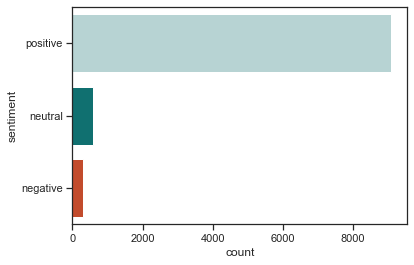

In [87]:
Cplot(df)

None


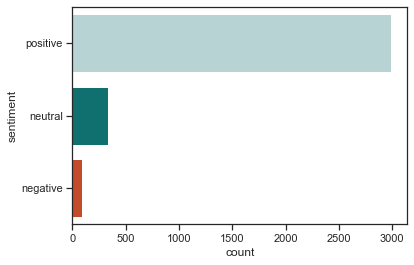

In [88]:
print(Cplot(df[df['Source']=='TrustPilot']))

None


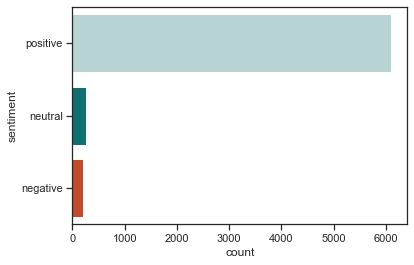

In [89]:
print(Cplot(df[df['Source']=='LC']))

In [90]:
# Lineplot function
def timeplot(df):
    g = sns.lineplot(x='Time2', y='compound', data=df)

    g.set(xticklabels=[]) 
    g.set(title='Sentiment of Tweets')
    g.set(xlabel="Time")
    g.set(ylabel="Sentiment")
    g.tick_params(bottom=False)

    g.axhline(0, ls='--', c = 'grey');

In [91]:
#Boxplot function
def Bplot(df):
    sns.boxplot(y='compound', 
                x='sentiment',
                palette=['#b2d8d8',"#008080", '#db3d13'], 
                data=df);

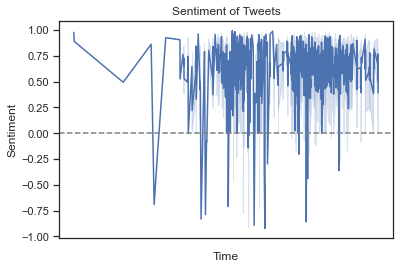

In [92]:
timeplot(df)

None


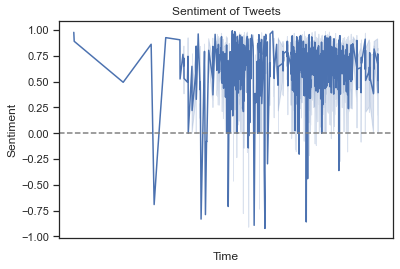

In [93]:
print(timeplot(df[df['Source']=='TrustPilot']))

None


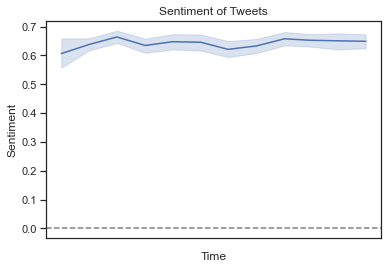

In [94]:
print(timeplot(df[df['Source']=='LC']))

In [95]:
#df = df.sort_values(by="Time2")
fig = px.line(df,x='Time2', y='compound')

# sort values
#fig.update_layout(barmode='line')

# show plot

fig.show()

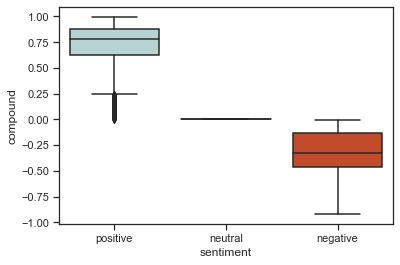

In [96]:
Bplot(df)

None


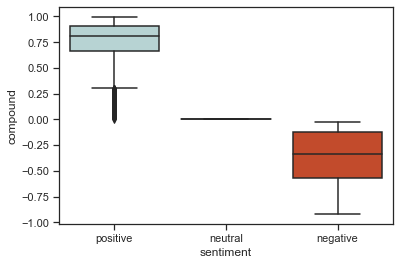

In [97]:
print(Bplot(df[df['Source']=='TrustPilot']))


None


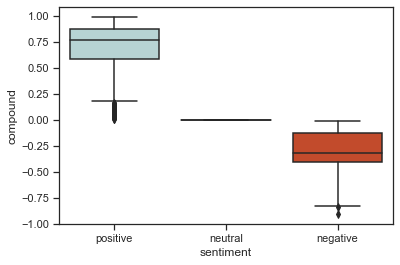

In [98]:
print(Bplot(df[df['Source']=='LC']))

In [99]:
nltk.download('state_union')

[nltk_data] Downloading package state_union to
[nltk_data]     /Users/adityaagrawal/nltk_data...
[nltk_data]   Package state_union is already up-to-date!


True

### 1. Application Process sentiment analysis

In [100]:
df_process.reset_index(inplace = True)

In [101]:
analyzer2 = SentimentIntensityAnalyzer()
df_process['polarity'] = df_process['1_string_lem'].apply(lambda x: analyzer2.polarity_scores(x))
# Change data structure
df_process = pd.concat(
    [df_process.drop(['polarity'], axis=1), 
     df_process['polarity'].apply(pd.Series)], axis=1)
df_process.head()

<ipython-input-101-4a26cb9b7dd7>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,index,id,Title,Content,Time2,Source,Tags,1_token,1_string,1_string_fdist,1_string_lem,is_equal,neg,neu,pos,compound
0,5,5,Easy and Quick,very pleased with how simple and quick the pro...,2022-05-29,TrustPilot,NaN,"[pleased, simple, quick, process, associates, ...",pleased simple quick process associates contac...,pleased simple quick process associates contac...,pleased simple quick process associates contac...,True,0.000,0.526,0.474,0.8934
1,6,6,Satisfied Customer,i was very impressed with lending club’s custo...,2022-05-28,TrustPilot,NaN,"[impressed, customer, service, speed, processi...",impressed customer service speed processing ev...,impressed customer service speed processing ev...,impressed customer service speed processing ev...,True,0.000,0.580,0.420,0.8271
2,10,10,While the application process is fairly…,while the application process is fairly quick ...,2022-05-28,TrustPilot,NaN,"[application, process, fairly, quick, paid, us...",application process fairly quick paid using fu...,application process fairly quick paid using fu...,application process fairly quick paid using fu...,True,0.022,0.844,0.134,0.7906
3,11,11,Loan process was quick and easy,loan process was quick and easy. thank you for...,2022-05-27,TrustPilot,NaN,"[process, quick, easy, thank, professionalism,...",process quick easy thank professionalism knowl...,process quick easy thank professionalism knowl...,process quick easy thank professionalism knowl...,True,0.000,0.481,0.519,0.6597
4,12,12,loan,the loan process was easy but i wasn't happy w...,2022-05-27,TrustPilot,NaN,"[process, easy, happy, received, dollars, inst...",process easy happy received dollars instead do...,process easy happy received dollars instead do...,process easy happy received dollars instead do...,True,0.195,0.461,0.344,0.6369


In [102]:
df_process['sentiment'] = df_process['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
print(df_process.loc[df_process['compound'].idxmax()].values)
print(df_process.loc[df_process['compound'].idxmin()].values)
# Number of tweets 

[1953 1953 'Lending club approved my loan request…'
 'lending club approved my loan request in  minutes and funded my loan in  hrs! it is the fastest process i’ve ever seen. i love the option they have to send payments directly to creditors. i used this option to pay all of my credit cards to under a % balance and they put the rest in my bank account. which was a godsend as our water pump went out in our car the day my loan funded! for those of you wondering or thinking i borrowed a couple thousand i’d like to tell you it was not. i borrowed k, i had $ go directly to my credit card accounts and the rest(- the processing fee) into my bank account. yes the interest is a little high but i was given the option of cutting the terms from  months to  for a small payment difference. which would have also lowered the interest about % but i chose the longer terms just incase covid rears it’s ugly head again and we end up closing down again. i can always many extra principal payments as well as s

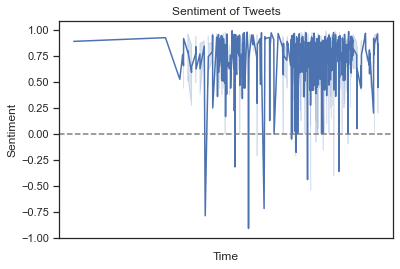

In [103]:
timeplot(df_process)

None


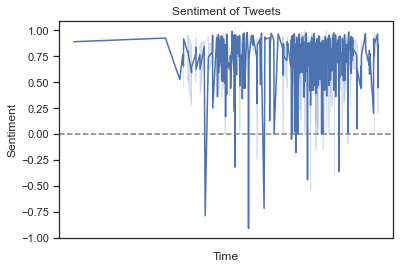

In [104]:
print(timeplot(df_process[df_process['Source']=='TrustPilot']))

None


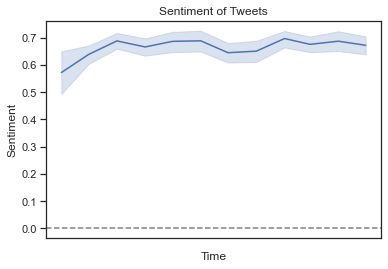

In [105]:
print(timeplot(df_process[df_process['Source']=='LC']))

In [106]:
df_process = df_process.sort_values(by="Time2")
fig = px.line(df_process,x='Time2', y='compound')

# sort values
#fig.update_layout(barmode='line')

# show plot

fig.show()

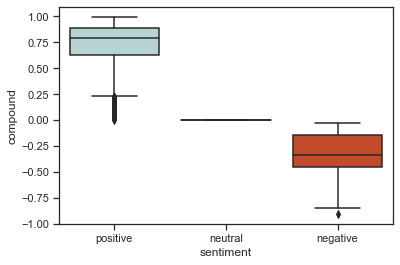

In [107]:
Bplot(df_process)

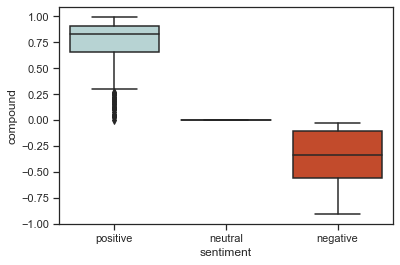

In [108]:
Bplot(df_process[df_process['Source']=='TrustPilot'])

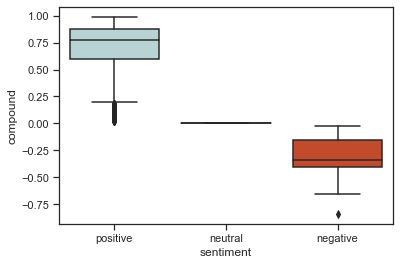

In [109]:
Bplot(df_process[df_process['Source']=='LC'])

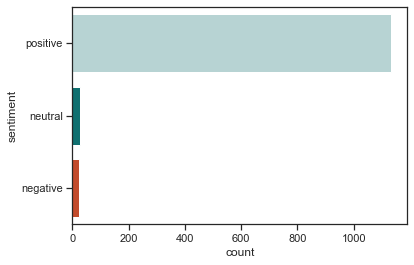

In [110]:
Cplot(df_process[df_process['Source']=='TrustPilot'])

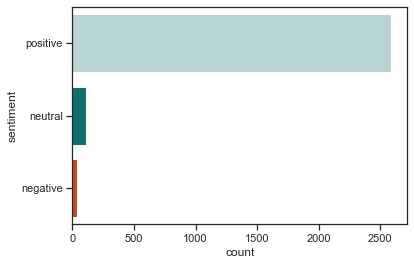

In [111]:
Cplot(df_process[df_process['Source']=='LC'])

None
None


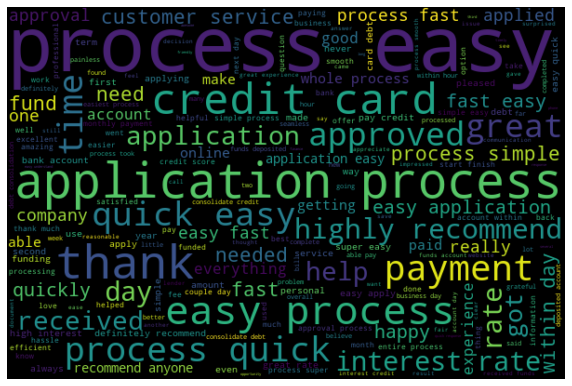

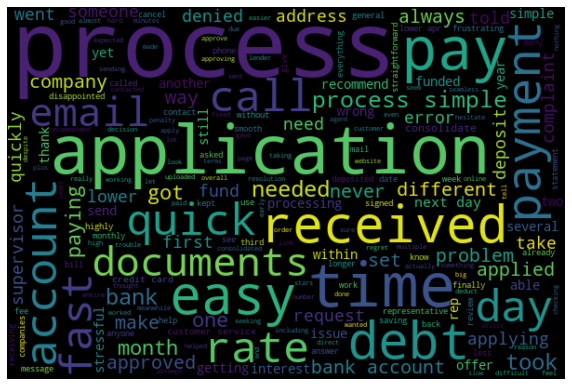

In [112]:
print(wordcloud(df_process[df_process['sentiment']=='positive']['1_string_lem']))
print(wordcloud(df_process[df_process['sentiment']=='negative']['1_string_lem']))

### 2. Service sentiment analysis

In [113]:
df_service.reset_index(inplace = True)

In [114]:
analyzer3 = SentimentIntensityAnalyzer()

df_service['polarity'] = df_service['1_string_lem'].apply(lambda x: analyzer3.polarity_scores(x))
# Change data structure
df_service = pd.concat(
    [df_service.drop(['polarity'], axis=1), 
     df_service['polarity'].apply(pd.Series)], axis=1)
df_service['sentiment'] = df_service['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
print(df_service.loc[df_service['compound'].idxmax()].values)
print(df_service.loc[df_service['compound'].idxmin()].values)
# Number of tweets 

<ipython-input-114-f481286669b3>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[2619 2619 'Best decision we made'
 "my husband and i have over $,  in credit card debit. our credit is good and we made more than our minimum payments each month. however, we both thought that we had to do something, but didn't know what, but knew we had to get these credit cards paid off so that we had  monthly payment and  interest charge vs all the different interest charges that are applied each month on each of our charge credits, we felt we were on a hamster wheel. i was getting flyers in the mail from all kinds of different companies that offered loans to pay off your credit card debit. i called a few of them but felt that it was not a good fit for us, then i received a flyer from lending club.  i called lending club and the customer service representative i spoke with was so knowledgeable and took the time to explain everything to me because this was a big decision that we were going to make and i wanted to make sure this would be a good fit. i felt like family and not just an

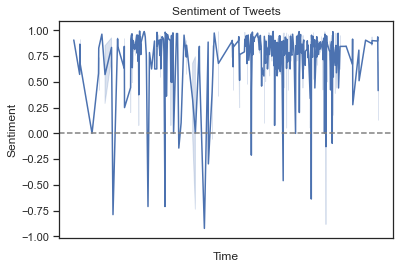

In [115]:
timeplot(df_service)

None


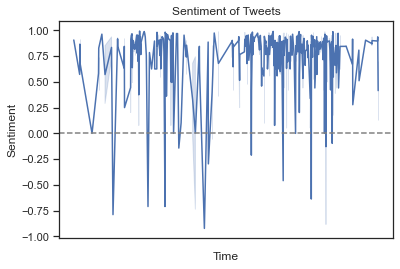

In [116]:
print(timeplot(df_service[df_service['Source']=='TrustPilot']))

None


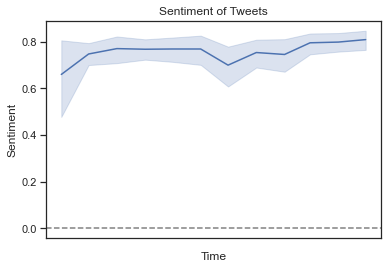

In [117]:
print(timeplot(df_service[df_service['Source']=='LC']))

In [118]:
df_service = df_service.sort_values(by="Time2")
fig = px.line(df_service,x='Time2', y='compound')

# sort values
#fig.update_layout(barmode='line')

# show plot

fig.show()

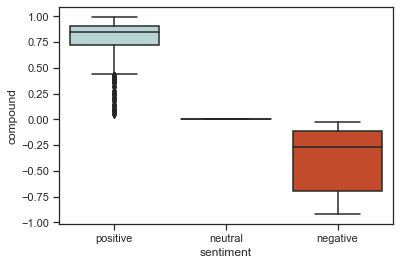

In [119]:
Bplot(df_service)

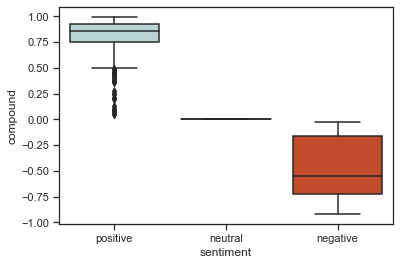

In [120]:
Bplot(df_service[df_service['Source']=='TrustPilot'])

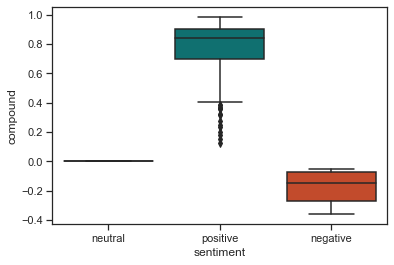

In [121]:
Bplot(df_service[df_service['Source']=='LC'])

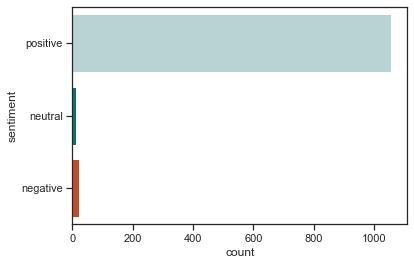

In [122]:
Cplot(df_service)

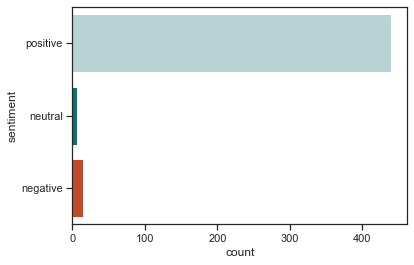

In [123]:
Cplot(df_service[df_service['Source']=='TrustPilot'])

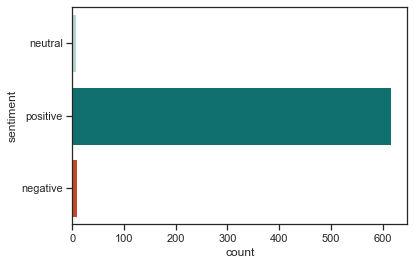

In [124]:
Cplot(df_service[df_service['Source']=='LC'])

None
None


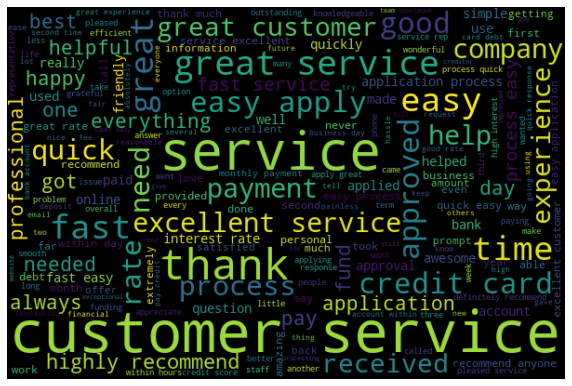

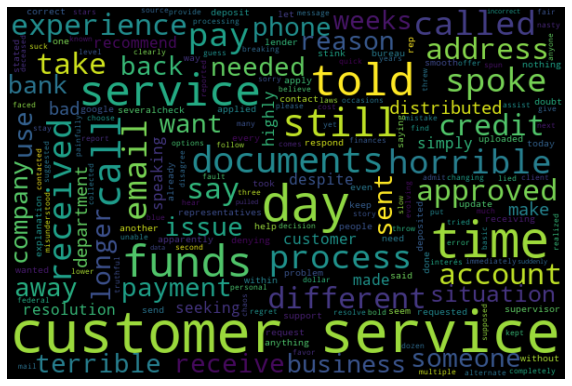

In [125]:
print(wordcloud(df_service[df_service['sentiment']=='positive']['1_string_lem']))
print(wordcloud(df_service[df_service['sentiment']=='negative']['1_string_lem']))

### 3. Interest rates sentiment analysis

In [126]:
df_rates.reset_index(inplace = True)

In [127]:
analyzer4 = SentimentIntensityAnalyzer()

df_rates['polarity'] = df_rates['1_string_lem'].apply(lambda x: analyzer4.polarity_scores(x))
# Change data structure
df_rates = pd.concat(
    [df_rates.drop(['polarity'], axis=1), 
     df_rates['polarity'].apply(pd.Series)], axis=1)
df_rates['sentiment'] = df_rates['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
print(df_rates.loc[df_rates['compound'].idxmax()].values)
print(df_rates.loc[df_rates['compound'].idxmin()].values)
# Number of tweets 

<ipython-input-127-6b61e7546415>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[1953 1953 'Lending club approved my loan request…'
 'lending club approved my loan request in  minutes and funded my loan in  hrs! it is the fastest process i’ve ever seen. i love the option they have to send payments directly to creditors. i used this option to pay all of my credit cards to under a % balance and they put the rest in my bank account. which was a godsend as our water pump went out in our car the day my loan funded! for those of you wondering or thinking i borrowed a couple thousand i’d like to tell you it was not. i borrowed k, i had $ go directly to my credit card accounts and the rest(- the processing fee) into my bank account. yes the interest is a little high but i was given the option of cutting the terms from  months to  for a small payment difference. which would have also lowered the interest about % but i chose the longer terms just incase covid rears it’s ugly head again and we end up closing down again. i can always many extra principal payments as well as s

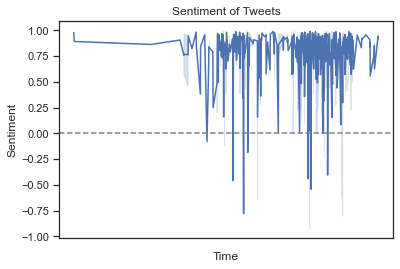

In [128]:
timeplot(df_rates)

None


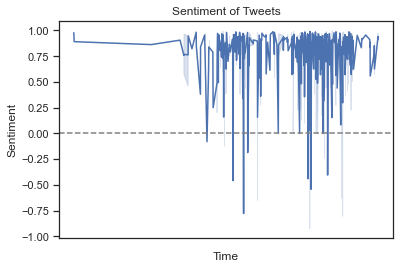

In [129]:
print(timeplot(df_rates[df_rates['Source']=='TrustPilot']))

None


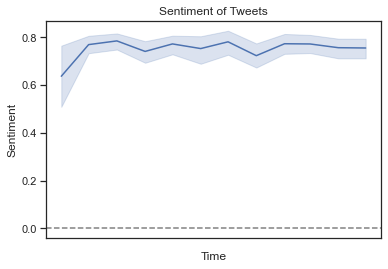

In [130]:
print(timeplot(df_rates[df_rates['Source']=='LC']))

In [131]:
df_rates = df_rates.sort_values(by="Time2")
fig = px.line(df_rates,x='Time2', y='compound')

# sort values
#fig.update_layout(barmode='line')

# show plot

fig.show()

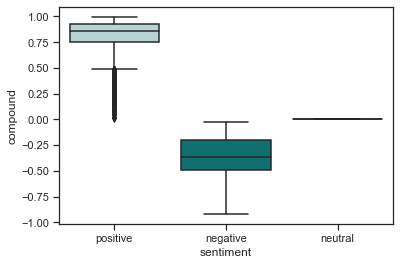

In [132]:
Bplot(df_rates)

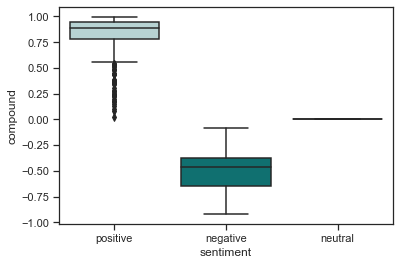

In [133]:
Bplot(df_rates[df_rates['Source']=='TrustPilot'])

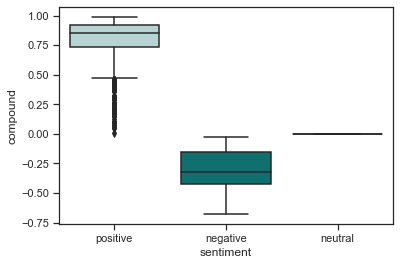

In [134]:
Bplot(df_rates[df_rates['Source']=='LC'])

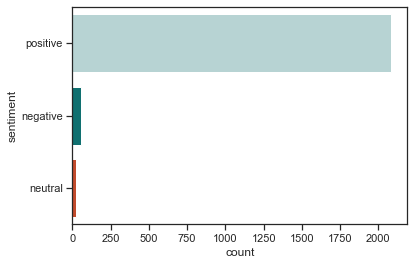

In [135]:
Cplot(df_rates)

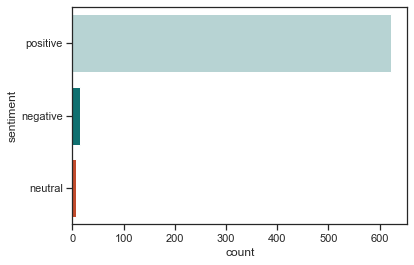

In [136]:
Cplot(df_rates[df_rates['Source']=='TrustPilot'])

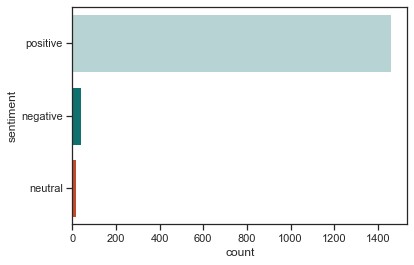

In [137]:
Cplot(df_rates[df_rates['Source']=='LC'])

None
None


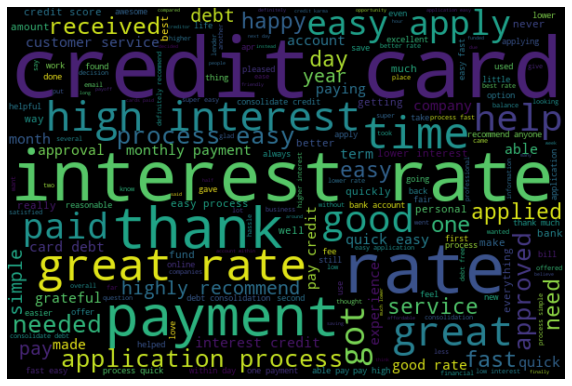

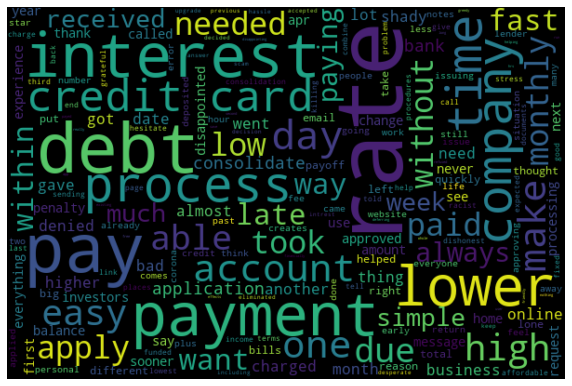

In [138]:
print(wordcloud(df_rates[df_rates['sentiment']=='positive']['1_string_lem']))
print(wordcloud(df_rates[df_rates['sentiment']=='negative']['1_string_lem']))

In [139]:
df_rates[df_rates['sentiment']=='positive'].to_csv('Downloads/rpos.csv')
df_rates[df_rates['sentiment']=='negative'].to_csv('Downloads/rneg.csv')

### 4. Customer experience sentiment analysis

In [140]:
df_exp.reset_index(inplace = True)

In [141]:
analyzer5 = SentimentIntensityAnalyzer()

df_exp['polarity'] = df_exp['1_string_lem'].apply(lambda x: analyzer5.polarity_scores(x))
# Change data structure
df_exp = pd.concat(
    [df_exp.drop(['polarity'], axis=1), 
     df_exp['polarity'].apply(pd.Series)], axis=1)
df_exp['sentiment'] = df_exp['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
print(df_exp.loc[df_exp['compound'].idxmax()].values)
print(df_exp.loc[df_exp['compound'].idxmin()].values)
# Number of tweets 

<ipython-input-141-3bb49d3b4fcb>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[871 871 'Thus far, this has been completely excellent.'
 "i have just started with lending club so i dont know much about what it is going to be like later, but that seems like the easy part. i signed up through credit karma because i was repairing my credit for the last few years and i wanted to up my total credit amount while paying off all my cards and lower percentage used. i finally spent about  years paying those off on time or paying more than minimums and getting my credit to a reasonable number to work with after clearing up other problems and debts - about . (the student loan pause really helped this)i had some recommendations from credit karma to use a few places and i liked the in depth research results i found about lending club. i applied through my credit karma link, was approved for the amount i needed, and my money was in my account in about  hours. it was fast. my experience was that i never had to send them anything else. never had to talk to anyone. never had to ev

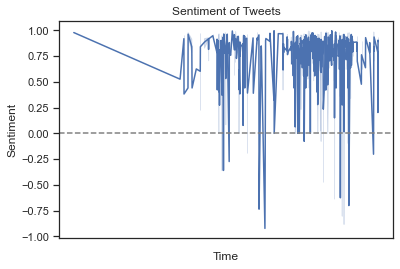

In [142]:
timeplot(df_exp)

None


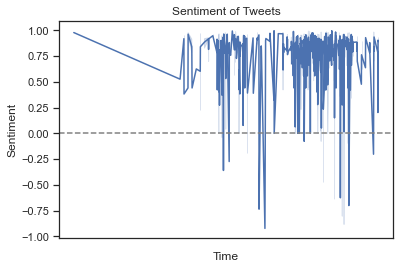

In [143]:
print(timeplot(df_exp[df_exp['Source']=='TrustPilot']))

None


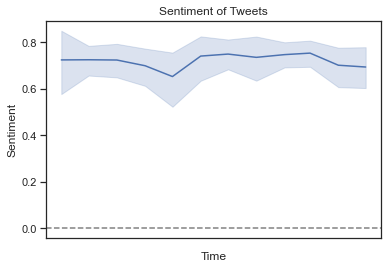

In [144]:
print(timeplot(df_exp[df_exp['Source']=='LC']))

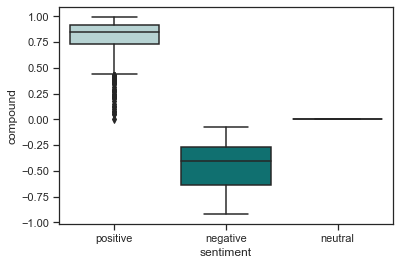

In [145]:
Bplot(df_exp)

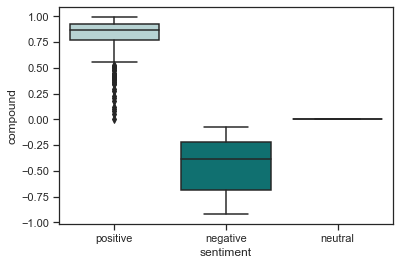

In [146]:
Bplot(df_exp[df_exp['Source']=='TrustPilot'])

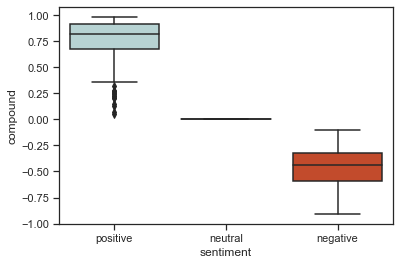

In [147]:
Bplot(df_exp[df_exp['Source']=='LC'])

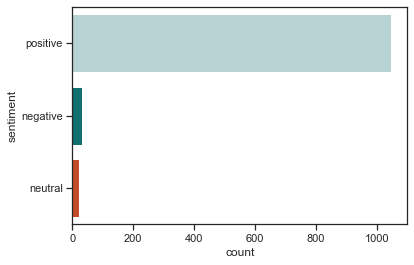

In [148]:
Cplot(df_exp)

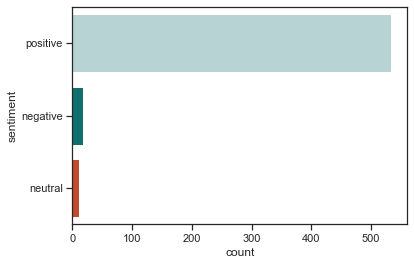

In [149]:
Cplot(df_exp[df_exp['Source']=='TrustPilot'])

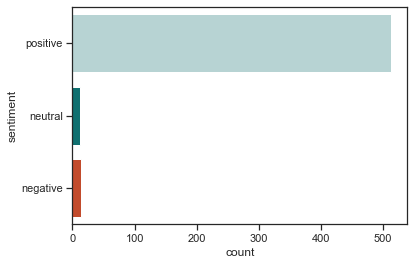

In [150]:
Cplot(df_exp[df_exp['Source']=='LC'])

None
None


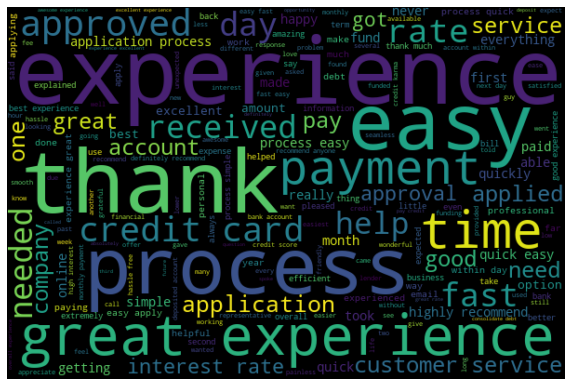

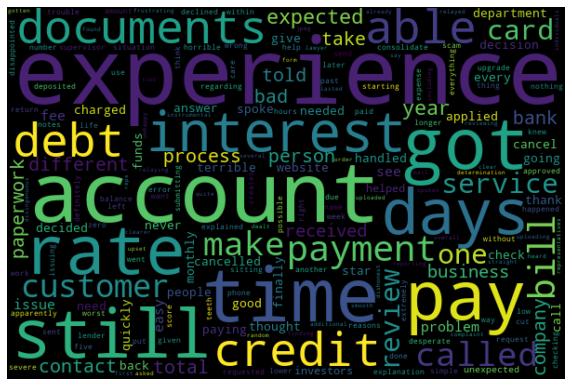

In [151]:
print(wordcloud(df_exp[df_exp['sentiment']=='positive']['1_string_lem']))
print(wordcloud(df_exp[df_exp['sentiment']=='negative']['1_string_lem']))

### Collocations

In [152]:
words1= nltk.word_tokenize(all_words_lem)

In [153]:
# use to find bigrams, which are pairs of words
from nltk.metrics import BigramAssocMeasures
import nltk
from nltk.collocations import *
from nltk import bigrams
from nltk import trigrams

### Bigrams


In [154]:
#from nltk import quadgrams
#fgm = nltk.collocations.QuadgramAssocMeasures()
#list1=pd.Series(all_words_lem).str.split(expand=True)
filter1 = lambda *w: 'service' not in w
bgm    = nltk.collocations.BigramAssocMeasures()
finder1 = nltk.collocations.BigramCollocationFinder.from_words(words1)
finder1.apply_ngram_filter(filter1)
print (finder1.nbest(bgm.likelihood_ratio, 10))
#scored = finder.score_ngrams( bgm.likelihood_ratio  )

[('customer', 'service'), ('excellent', 'service'), ('great', 'service'), ('fast', 'service'), ('service', 'rep'), ('pleased', 'service'), ('service', 'excellent'), ('easy', 'service'), ('service', 'reps'), ('prompt', 'service')]


### Trigrams


In [155]:
filter2 = lambda *w: 'process' not in w
filter22= lambda *w: 'credit' in w
tgm = nltk.collocations.TrigramAssocMeasures()
finder2 = nltk.collocations.TrigramCollocationFinder.from_words(words1)
finder2.apply_ngram_filter(filter2)
finder2.apply_ngram_filter(filter22)
print (finder2.nbest(tgm.likelihood_ratio, 10))

[('process', 'easy', 'apply'), ('application', 'process', 'easy'), ('highly', 'recommend', 'process'), ('process', 'highly', 'recommend'), ('application', 'process', 'quick'), ('application', 'process', 'simple'), ('easy', 'apply', 'process'), ('customer', 'service', 'process'), ('process', 'customer', 'service'), ('application', 'process', 'fast')]


In [156]:
filter3 = lambda *w: 'rates' not in w
filter32= lambda *w: 'credit' in w
tgm = nltk.collocations.TrigramAssocMeasures()
finder3 = nltk.collocations.TrigramCollocationFinder.from_words(words1)
finder3.apply_ngram_filter(filter3)
finder3.apply_ngram_filter(filter32)
print (finder3.nbest(tgm.likelihood_ratio, 10))

[('rates', 'highly', 'recommend'), ('rates', 'easy', 'apply'), ('easy', 'apply', 'rates'), ('rates', 'customer', 'service'), ('customer', 'service', 'rates'), ('application', 'process', 'rates'), ('rates', 'application', 'process'), ('high', 'interest', 'rates'), ('recommend', 'anyone', 'rates'), ('rates', 'quick', 'easy')]


In [157]:
#print (finder2.nbest(bgm.likelihood_ratio, 10))

In [158]:
#finder.nbest(bigram_measures.likelihood_ratio, 10)

###  Application Process

In [159]:
wd=[]
for s in df_process['1_string_lem']:
    #s='The world is a small place, we should try to take care of this place.'
    m1 = re.search(r'((?:\w+\W+){,4})(process)\W+((?:\w+\W+){,4})', s)
    m2 = re.search(r'((?:\w+\W+){,4})(processing)\W+((?:\w+\W+){,4})', s)
    m3 = re.search(r'((?:\w+\W+){,4})(application)\W+((?:\w+\W+){,4})', s)
    #m3 = re.search(r'((?:\w+\W+){,4})(application)', s)
    #print(m3)
    if m1:
        l = [ x.strip().split() for x in m1.groups()]
    elif m2:
        l = [ x.strip().split() for x in m2.groups()]
    elif m3:
        l = [ x.strip().split() for x in m3.groups()]
    left, right = l[0], l[2]
    if(len(left)==0 & len(right)==0):
        words = s.split()
        if(words[-1]=='application' or words[-1]=='process' or words[-1]=='processing'):
            #print(words[-5:-1])
            left=words[-4:-1]
        else:
            #print(words[1:4])
            right=words[1:3]
    #else:
     #   print (left, right)
    wd.append(left+right)
    left.clear()
    right.clear()
    #print(left+right)
dfpro2=pd.DataFrame()
dfpro2['wd']=wd

In [160]:
dfpro2['Source']=df_process['Source']
dfpro2['Time2']=df_process['Time2']
dfpro2['string'] = dfpro2['wd'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
dfpro2

,wd,Source,Time2,string
0,"[whole, quick, easy, interest, rate]",TrustPilot,2022-05-29,whole quick easy interest rate
1,"[could, give, little, informative, honestly, e...",TrustPilot,2022-05-28,could give little informative honestly even kn...
2,"[provided, although, completed, survey, satisf...",TrustPilot,2022-05-28,provided although completed survey satisfactor...
3,"[thank, helping, one, else, extremely, fast, d...",TrustPilot,2022-05-27,thank helping one else extremely fast deposite...
4,"[surprisingly, simple, best, credit, hopefully...",TrustPilot,2022-05-27,surprisingly simple best credit hopefully get
...,...,...,...,...
3923,"[made, getting, personal, easy, quick]",LC,2021-06-15,made getting personal easy quick
3924,"[easy, within, days, happy, decided]",LC,2021-06-15,easy within days happy decided
3925,"[thank, company, helping, timely, time, events...",LC,2021-06-15,thank company helping timely time events need
3926,"[process, simple, efficient, love, must, made,...",LC,2021-06-15,process simple efficient love must made mistak...


In [161]:
analyzer6 = SentimentIntensityAnalyzer()
dfpro2['polarity'] = dfpro2['string'].apply(lambda x: analyzer6.polarity_scores(x))
# Change data structure
dfpro2 = pd.concat(
    [dfpro2.drop(['polarity'], axis=1), 
     dfpro2['polarity'].apply(pd.Series)], axis=1)
dfpro2.head()

,wd,Source,Time2,string,neg,neu,pos,compound
0,"[whole, quick, easy, interest, rate]",TrustPilot,2022-05-29,whole quick easy interest rate,0.000,0.337,0.663,0.7096
1,"[could, give, little, informative, honestly, e...",TrustPilot,2022-05-28,could give little informative honestly even kn...,0.000,0.720,0.280,0.4062
2,"[provided, although, completed, survey, satisf...",TrustPilot,2022-05-28,provided although completed survey satisfactor...,0.267,0.517,0.216,-0.1531
3,"[thank, helping, one, else, extremely, fast, d...",TrustPilot,2022-05-27,thank helping one else extremely fast deposite...,0.000,0.561,0.439,0.5719
4,"[surprisingly, simple, best, credit, hopefully...",TrustPilot,2022-05-27,surprisingly simple best credit hopefully get,0.000,0.146,0.854,0.8934


In [162]:
dfpro2['sentiment'] = dfpro2['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
print(dfpro2.loc[dfpro2['compound'].idxmax()].values)
print(dfpro2.loc[dfpro2['compound'].idxmin()].values)

[list(['super', 'happy', 'since', 'beginning', 'super', 'easy', 'clear', 'smooth'])
 'LC' Timestamp('2021-08-15 00:00:00')
 'super happy since beginning super easy clear smooth' 0.0 0.15 0.85
 0.9517 'positive']
[list(['horrible', 'made', 'error', 'payment', 'completely', 'threw', 'finances', 'chaos'])
 'TrustPilot' Timestamp('2022-06-05 00:00:00')
 'horrible made error payment completely threw finances chaos' 0.67 0.33
 0.0 -0.8797 'negative']


None


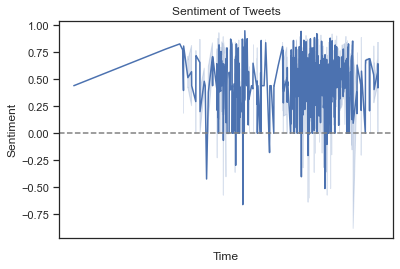

In [163]:
print(timeplot(dfpro2))

None


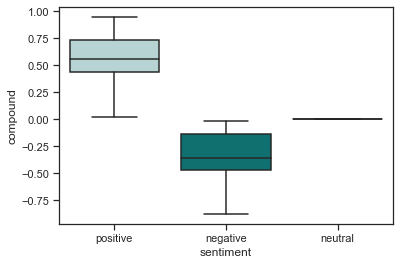

In [164]:

print(Bplot(dfpro2))

None


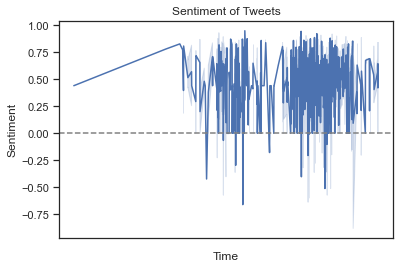

In [165]:
print(timeplot(dfpro2[dfpro2['Source']=='TrustPilot']))

None


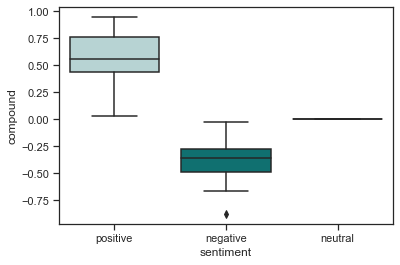

In [166]:

print(Bplot(dfpro2[dfpro2['Source']=='TrustPilot']))

None


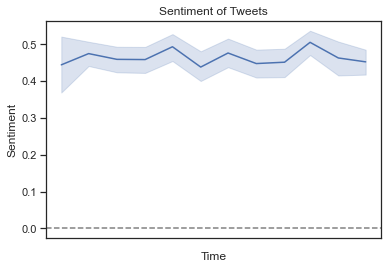

In [167]:
print(timeplot(dfpro2[dfpro2['Source']=='LC']))

None


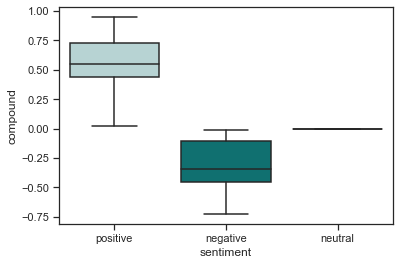

In [168]:

print(Bplot(dfpro2[dfpro2['Source']=='LC']))

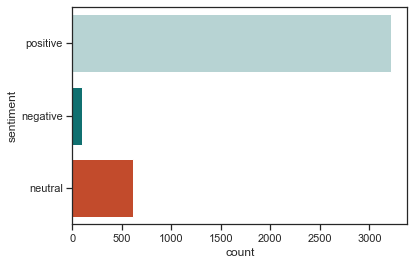

In [169]:
Cplot(dfpro2)

None
None


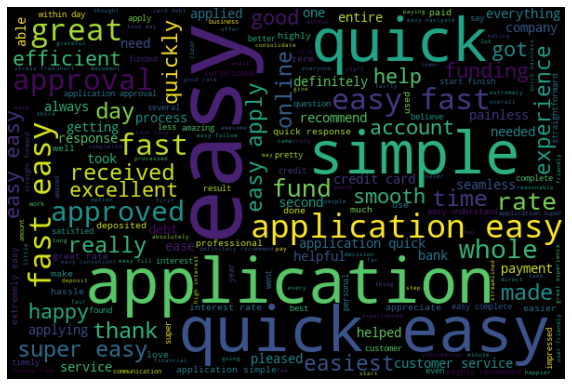

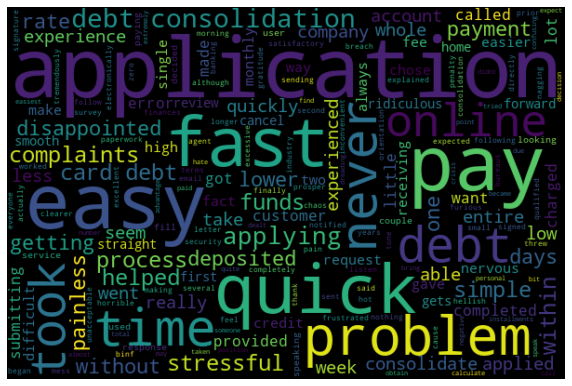

In [170]:
print(wordcloud(dfpro2[dfpro2['sentiment']=='positive']['string']))
print(wordcloud(dfpro2[dfpro2['sentiment']=='negative']['string']))

### Service

In [171]:
wd.clear()
for s in df_service['1_string_lem']:
    #s='The world is a small place, we should try to take care of this place.'
    m1 = re.search(r'((?:\w+\W+){,4})(service)\W+((?:\w+\W+){,4})', s)
    if m1:
        l = [ x.strip().split() for x in m1.groups()]
    left, right = l[0], l[2]
    if(len(left)==0 & len(right)==0):
        words = s.split()
        if(words[-1]=='service'):
            #print(words[-5:-1])
            left=words[-4:-1]
        else:
            #print(words[1:4])
            right=words[1:3]
    #else:
     #   print (left, right)
    wd.append(left+right)
    left.clear()
    right.clear()
dfservice2=pd.DataFrame()
dfservice2['wd']=wd

In [172]:
dfservice2['Source']=df_service['Source']
dfservice2['Time2']=df_service['Time2']
dfservice2['string'] = dfservice2['wd'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
analyzer7 = SentimentIntensityAnalyzer()
dfservice2['polarity'] = dfservice2['string'].apply(lambda x: analyzer7.polarity_scores(x))
# Change data structure
dfservice2 = pd.concat(
    [dfservice2.drop(['polarity'], axis=1), 
     dfservice2['polarity'].apply(pd.Series)], axis=1)
dfservice2.head()

,wd,Source,Time2,string,neg,neu,pos,compound
0,"[impression, prequalified, called, customer, g...",TrustPilot,2022-05-29,impression prequalified called customer guy ph...,0.0,0.566,0.434,0.5574
1,"[excellent, reviewing]",TrustPilot,2022-05-28,excellent reviewing,0.0,0.213,0.787,0.5719
2,"[please, keep, excellent, customer]",TrustPilot,2022-05-27,please keep excellent customer,0.0,0.250,0.750,0.7184
3,"[place, fast, friendly]",TrustPilot,2022-05-26,place fast friendly,0.0,0.385,0.615,0.4939
4,"[whether, online, phone, customer, everything,...",TrustPilot,2022-05-26,whether online phone customer everything smoot...,0.0,0.714,0.286,0.4215


In [173]:
dfservice2['sentiment'] = dfservice2['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
print(dfservice2.loc[dfservice2['compound'].idxmax()].values)
print(dfservice2.loc[dfservice2['compound'].idxmin()].values)

[list(['great', 'service', 'great', 'great', 'service', 'great']) 'LC'
 Timestamp('2021-07-15 00:00:00')
 'great service great great service great' 0.0 0.109 0.891 0.9545
 'positive']
[list(['dishonest', 'disingenuous', 'terrible', 'customer', 'bad']) 'LC'
 Timestamp('2021-09-15 00:00:00')
 'dishonest disingenuous terrible customer bad' 0.837 0.163 0.0 -0.8834
 'negative']


None


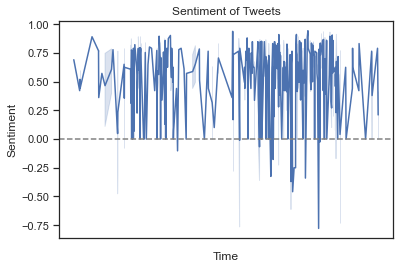

In [174]:
print(timeplot(dfservice2))

None


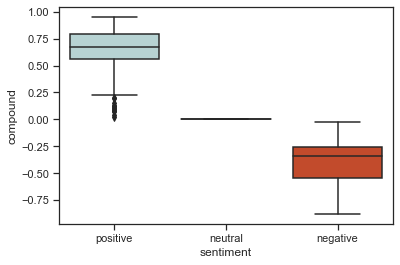

In [175]:

print(Bplot(dfservice2))

None


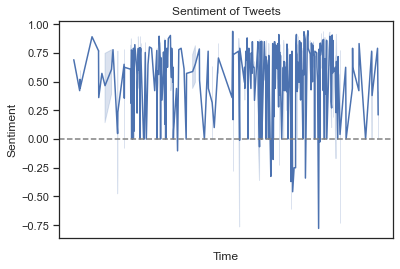

In [176]:
print(timeplot(dfservice2[dfservice2['Source']=='TrustPilot']))

None


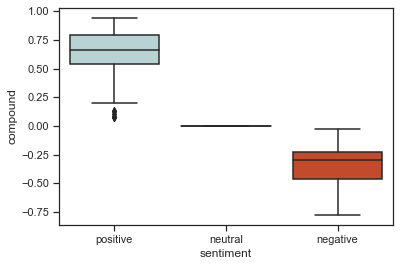

In [177]:

print(Bplot(dfservice2[dfservice2['Source']=='TrustPilot']))

None


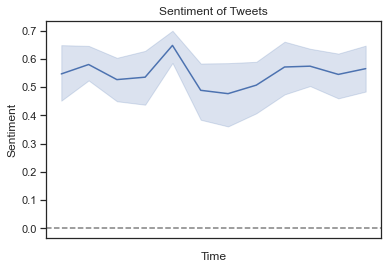

In [178]:
print(timeplot(dfservice2[dfservice2['Source']=='LC']))

None


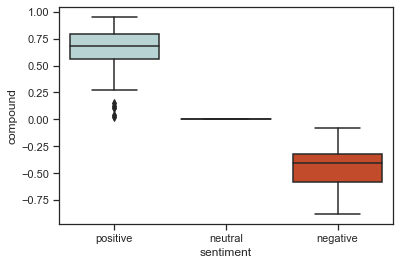

In [179]:

print(Bplot(dfservice2[dfservice2['Source']=='LC']))

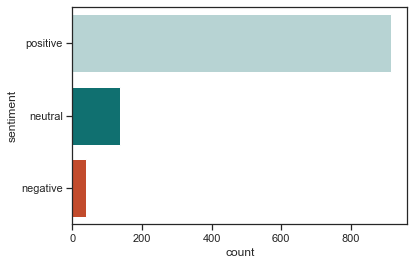

In [180]:
Cplot(dfservice2)

None
None


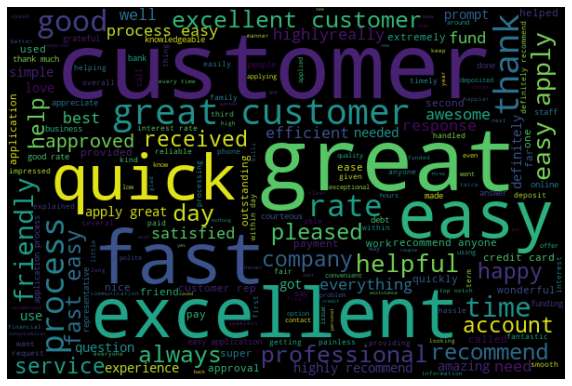

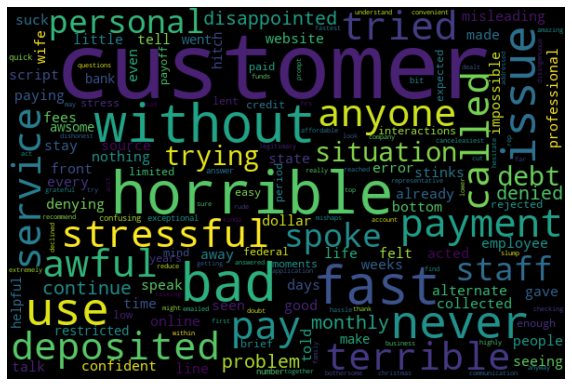

In [181]:
print(wordcloud(dfservice2[dfservice2['sentiment']=='positive']['string']))
print(wordcloud(dfservice2[dfservice2['sentiment']=='negative']['string']))

### Interest rates

In [182]:
wd.clear()
for s in df_rates['1_string_lem']:
    #s='The world is a small place, we should try to take care of this place.'
    m1 = re.search(r'((?:\w+\W+){,4})(interest)\W+((?:\w+\W+){,4})', s)
    m2 = re.search(r'((?:\w+\W+){,4})(rates)\W+((?:\w+\W+){,4})', s)
    m3 = re.search(r'((?:\w+\W+){,4})(apr)\W+((?:\w+\W+){,4})', s)
    #m3 = re.search(r'((?:\w+\W+){,4})(application)', s)
    #print(m3)
    if m1:
        l = [ x.strip().split() for x in m1.groups()]
    elif m2:
        l = [ x.strip().split() for x in m2.groups()]
    elif m3:
        l = [ x.strip().split() for x in m3.groups()]
    left, right = l[0], l[2]
    if(len(left)==0 & len(right)==0):
        words = s.split()
        if(words[-1]=='interest' or words[-1]=='rates' or words[-1]=='apr'):
            #print(words[-5:-1])
            left=words[-4:-1]
        else:
            #print(words[1:4])
            right=words[1:3]
    #else:
     #   print (left, right)
    wd.append(left+right)
    left.clear()
    right.clear()
    #print(left+right)
dfrates2=pd.DataFrame()
dfrates2['wd']=wd

In [183]:
dfrates2['Source']=df_rates['Source']
dfrates2['Time2']=df_rates['Time2']
dfrates2['string'] = dfrates2['wd'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
analyzer8 = SentimentIntensityAnalyzer()
dfrates2['polarity'] = dfrates2['string'].apply(lambda x: analyzer8.polarity_scores(x))
# Change data structure
dfrates2 = pd.concat(
    [dfrates2.drop(['polarity'], axis=1), 
     dfrates2['polarity'].apply(pd.Series)], axis=1)
dfrates2.head()

,wd,Source,Time2,string,neg,neu,pos,compound
0,"[fast, efficient, showed, genuine, helping, ge...",TrustPilot,2022-05-28,fast efficient showed genuine helping getting ...,0.0,0.388,0.612,0.7845
1,"[whole, process, quick, easy, rate, payments, ...",TrustPilot,2022-05-27,whole process quick easy rate payments looking...,0.0,0.526,0.474,0.6597
2,"[good, enough, paid, full, high, mighty, spit,...",TrustPilot,2022-05-27,good enough paid full high mighty spit face,0.0,0.707,0.293,0.4404
3,"[qualify, going, refer, high, bank, think, ban...",TrustPilot,2022-05-27,qualify going refer high bank think banks like,0.0,0.737,0.263,0.3612
4,"[someone, refinance]",TrustPilot,2022-05-27,someone refinance,0.0,1.000,0.000,0.0000


In [184]:
dfrates2['sentiment'] = dfrates2['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
print(dfrates2.loc[dfrates2['compound'].idxmax()].values)
print(dfrates2.loc[dfrates2['compound'].idxmin()].values)

[list(['super', 'easy', 'loved', 'great', 'rates', 'definitely', 'recommend', 'friends'])
 'TrustPilot' Timestamp('2021-07-15 00:00:00')
 'super easy loved great rates definitely recommend friends' 0.0 0.041
 0.959 0.9723 'positive']
[list(['burdened', 'high', 'debt', 'high', 'rates', 'consolidated', 'debt', 'nearly'])
 'LC' Timestamp('2021-11-15 00:00:00')
 'burdened high debt high rates consolidated debt nearly' 0.606 0.394 0.0
 -0.7717 'negative']


None


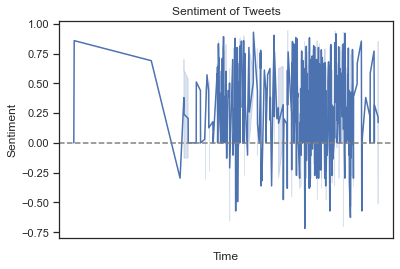

In [185]:
print(timeplot(dfrates2))

None


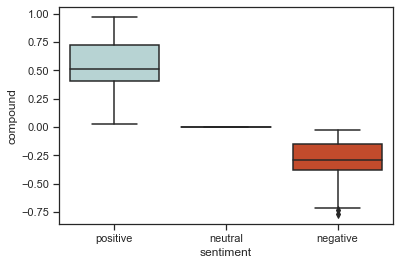

In [186]:

print(Bplot(dfrates2))

None


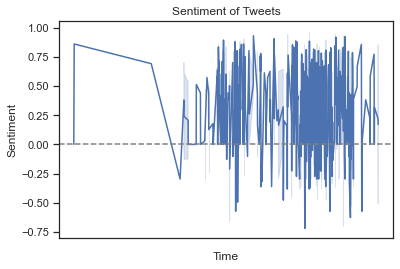

In [187]:
print(timeplot(dfrates2[dfrates2['Source']=='TrustPilot']))

None


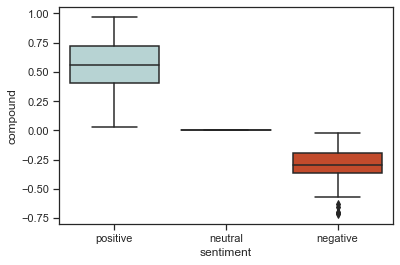

In [188]:

print(Bplot(dfrates2[dfrates2['Source']=='TrustPilot']))

None


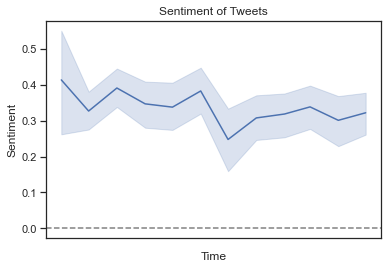

In [189]:
print(timeplot(dfrates2[dfrates2['Source']=='LC']))

None


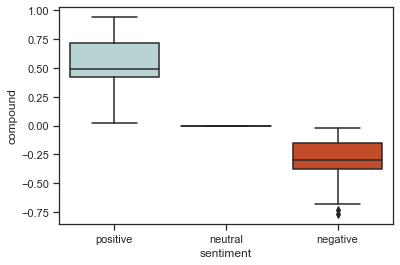

In [190]:

print(Bplot(dfrates2[dfrates2['Source']=='LC']))

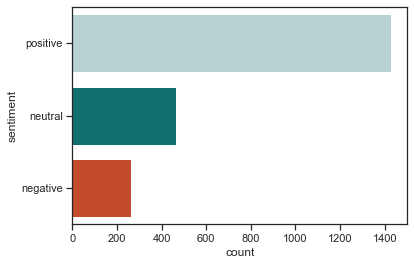

In [191]:
Cplot(dfrates2)

None
None


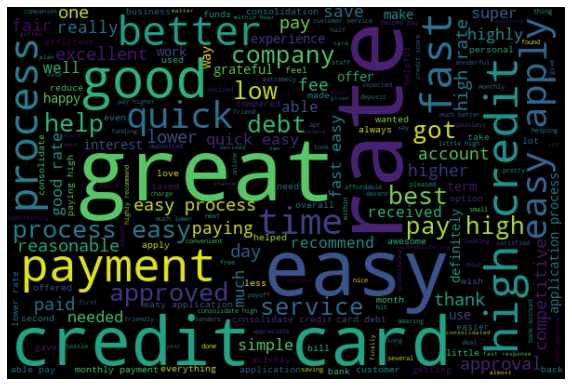

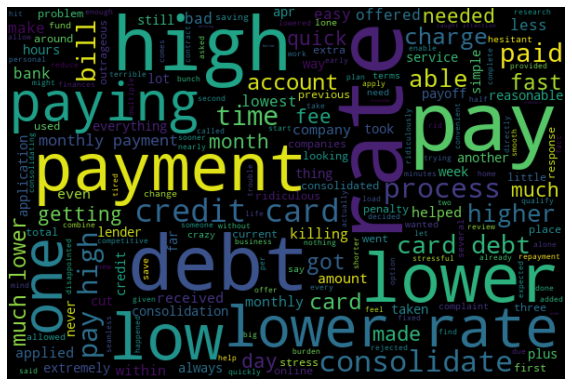

In [192]:
print(wordcloud(dfrates2[dfrates2['sentiment']=='positive']['string']))
print(wordcloud(dfrates2[dfrates2['sentiment']=='negative']['string']))

### Experience

In [193]:
wd.clear()
for s in df_exp['1_string_lem']:
    #s='The world is a small place, we should try to take care of this place.'
    m1 = re.search(r'((?:\w+\W+){,4})(experience)\W+((?:\w+\W+){,4})', s)
    m2 = re.search(r'((?:\w+\W+){,4})(exp)\W+((?:\w+\W+){,4})', s)
    #m3 = re.search(r'((?:\w+\W+){,4})(application)', s)
    #print(m3)
    if m1:
        l = [ x.strip().split() for x in m1.groups()]
    elif m2:
        l = [ x.strip().split() for x in m2.groups()]
    left, right = l[0], l[2]
    if(len(left)==0 & len(right)==0):
        words = s.split()
        if(words[-1]=='experience' or words[-1]=='exp'):
            #print(words[-5:-1])
            left=words[-4:-1]
        else:
            #print(words[1:4])
            right=words[1:3]
    #else:
     #   print (left, right)
    wd.append(left+right)
    left.clear()
    right.clear()
    #print(left+right)
dfexp2=pd.DataFrame()
dfexp2['wd']=wd

In [194]:
dfexp2['Source']=df_exp['Source']
dfexp2['Time2']=df_exp['Time2']
dfexp2['string'] = dfexp2['wd'].apply(lambda x: ' '.join([item for item in x if len(item)>2]))
analyzer9 = SentimentIntensityAnalyzer()
dfexp2['polarity'] = dfexp2['string'].apply(lambda x: analyzer9.polarity_scores(x))
# Change data structure
dfexp2 = pd.concat(
    [dfexp2.drop(['polarity'], axis=1), 
     dfexp2['polarity'].apply(pd.Series)], axis=1)
dfexp2.head()

,wd,Source,Time2,string,neg,neu,pos,compound
0,"[simple, quick]",TrustPilot,2022-05-29,simple quick,0.0,1.000,0.000,0.0000
1,"[second, personal]",TrustPilot,2022-05-27,second personal,0.0,1.000,0.000,0.0000
2,"[high, interest, thanks, much]",TrustPilot,2022-05-26,high interest thanks much,0.0,0.253,0.747,0.7096
3,"[fantastic, service]",TrustPilot,2022-05-26,fantastic service,0.0,0.217,0.783,0.5574
4,"[awesome, making, guys, went, online]",TrustPilot,2022-05-25,awesome making guys went online,0.0,0.494,0.506,0.6249


In [195]:
dfexp2['sentiment'] = dfexp2['compound'].apply(lambda x: 'positive' if x >0 else 'neutral' if x==0 else 'negative')
print(dfexp2.loc[dfexp2['compound'].idxmax()].values)
print(dfexp2.loc[dfexp2['compound'].idxmin()].values)

[list(['process', 'fast', 'easy', 'great', 'definitely', 'recommend', 'family', 'friends'])
 'LC' Timestamp('2021-08-15 00:00:00')
 'process fast easy great definitely recommend family friends' 0.0 0.164
 0.836 0.936 'positive']
[list(['month', 'problem', 'terrible', 'stressful', 'payment', 'due', 'bank', 'extremely'])
 'LC' Timestamp('2021-10-15 00:00:00')
 'month problem terrible stressful payment due bank extremely' 0.645 0.355
 0.0 -0.8442 'negative']


None


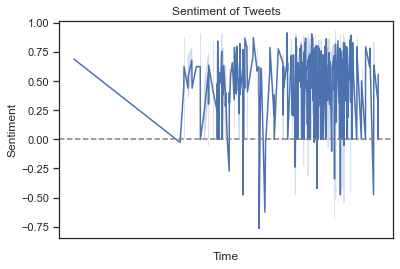

In [196]:
print(timeplot(dfexp2))

None


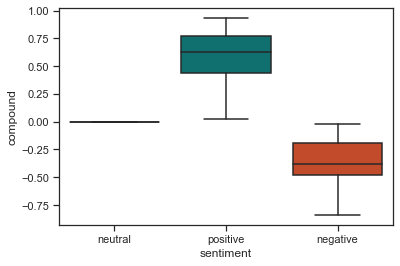

In [197]:

print(Bplot(dfexp2))

None


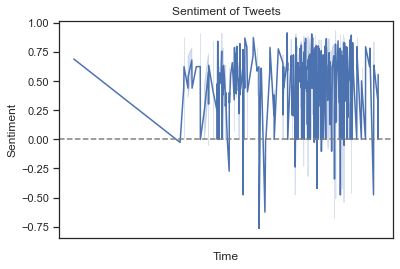

In [198]:
print(timeplot(dfexp2[dfexp2['Source']=='TrustPilot']))

None


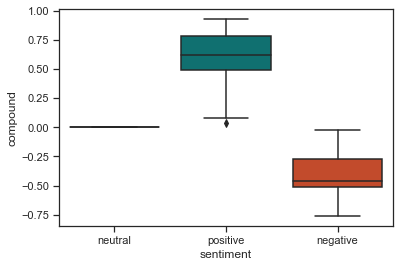

In [199]:

print(Bplot(dfexp2[dfexp2['Source']=='TrustPilot']))

None


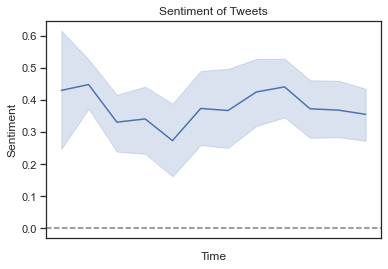

In [200]:
print(timeplot(dfexp2[dfexp2['Source']=='LC']))

None


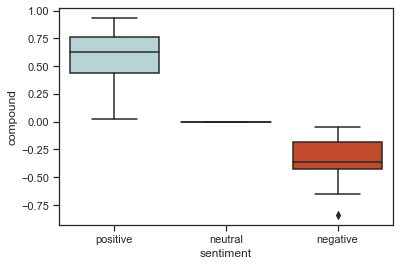

In [201]:

print(Bplot(dfexp2[dfexp2['Source']=='LC']))

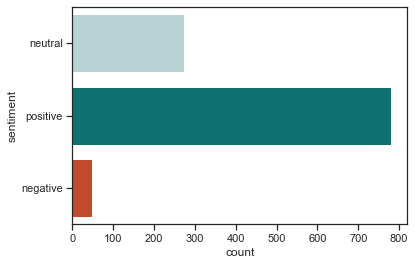

In [202]:
Cplot(dfexp2)

None
None


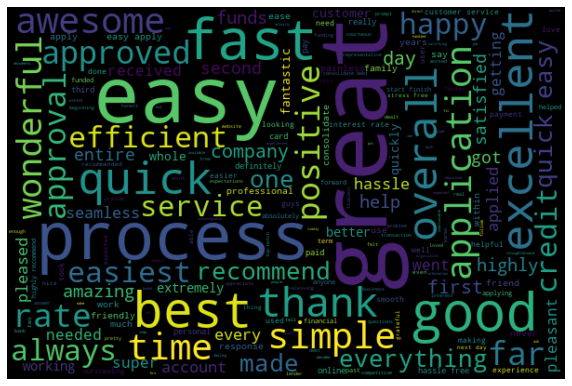

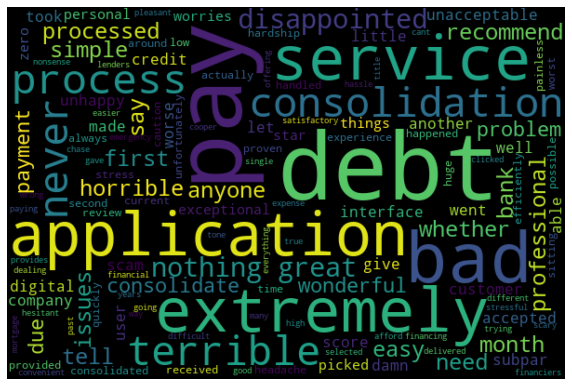

In [203]:
print(wordcloud(dfexp2[dfexp2['sentiment']=='positive']['string']))
print(wordcloud(dfexp2[dfexp2['sentiment']=='negative']['string']))